In [1]:
import pandas as pd
import numpy as np # linear algebra
import matplotlib.pyplot as plt
import seaborn as sns
import random
import requests
url=['https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xaa.dat','https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xab.dat', 'https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xac.dat','https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xad.dat','https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xae.dat', 'https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xaf.dat', 'https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xag.dat', 'https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xah.dat', 'https://archive.ics.uci.edu/ml/machine-learning-databases/statlog/vehicle/xai.dat']
data_by_line =[]
data=""

for perm in url:
    response = requests.get(perm)
    data += response.text 
data_by_line=(data.split('\n'))
print(data_by_line)
print(len(data_by_line))
data_by_line.remove('')  #there is an extra line, so remove it
print(len(data_by_line))
print(data_by_line)

print(data_by_line[0])
y=[]
x=[]
for i in range(0,len(data_by_line)-1): 
    data_by_line[i] = ' '.join(data_by_line[i].split()) 
    data_by_line[i] = data_by_line[i].split(' ')  
    print(data_by_line[i][18])
    y.append(data_by_line[i][18]) #last column is the target so assign it to y
    x.append(data_by_line[i][0:18]) # the first 18

    #for j in range(0, 18):
        #print(data_by_line[i][j])
    for j in range(0, 18):
        element = data_by_line[i][j]
        #print(i, j, element)
        x[i][j] = int(element)



['95 48 83 178 72 10 162 42 20 159 176 379 184 70 6 16 187 197 van ', '91 41 84 141 57 9 149 45 19 143 170 330 158 72 9 14 189 199 van ', '104 50 106 209 66 10 207 32 23 158 223 635 220 73 14 9 188 196 saab', '93 41 82 159 63 9 144 46 19 143 160 309 127 63 6 10 199 207 van ', '85 44 70 205 103 52 149 45 19 144 241 325 188 127 9 11 180 183 bus ', '107 57 106 172 50 6 255 26 28 169 280 957 264 85 5 9 181 183 bus ', '97 43 73 173 65 6 153 42 19 143 176 361 172 66 13 1 200 204 bus ', '90 43 66 157 65 9 137 48 18 146 162 281 164 67 3 3 193 202 van ', '86 34 62 140 61 7 122 54 17 127 141 223 112 64 2 14 200 208 van ', '93 44 98 197 62 11 183 36 22 146 202 505 152 64 4 14 195 204 saab', '86 36 70 143 61 9 133 50 18 130 153 266 127 66 2 10 194 202 van ', '90 34 66 136 55 6 123 54 17 118 148 224 118 65 5 26 196 202 saab', '88 46 74 171 68 6 152 43 19 148 180 349 192 71 5 11 189 195 bus ', '89 42 85 144 58 10 152 44 19 144 173 345 161 72 8 13 187 197 van ', '94 49 79 203 71 5 174 37 21 154 196 4

In [30]:
dfx = pd.DataFrame(x, columns = ['compactness', 'circularity', 'distance circularity', 'radius ratio', 'pr.azis aspect ratio', 'max length aspect ratio', 'scatter ratio', 'elongatedness', 'pr axis rectangularity', 'max length rectangularity', 'scaled variance MAJOR AXIS', 'scaled variance MINOR AXIS', 'scaled radiosu of gyration', 'skewness about major axis', 'skwness about minor axis', 'krutosis about minor axis', 'kurtosis about major axis', 'hollows ratio'], )
dfy=pd.DataFrame(y, columns = ['vehicle class'])
#plt.histogram()

dfall = pd.concat([dfx, dfy], axis=1, join='inner')
display(dfall)

,compactness,circularity,distance circularity,radius ratio,pr.azis aspect ratio,max length aspect ratio,scatter ratio,elongatedness,pr axis rectangularity,max length rectangularity,scaled variance MAJOR AXIS,scaled variance MINOR AXIS,scaled radiosu of gyration,skewness about major axis,skwness about minor axis,krutosis about minor axis,kurtosis about major axis,hollows ratio,vehicle class
0,95,48,83,178,72,10,162,42,20,159,176,379,184,70,6,16,187,197,van
1,91,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199,van
2,104,50,106,209,66,10,207,32,23,158,223,635,220,73,14,9,188,196,saab
3,93,41,82,159,63,9,144,46,19,143,160,309,127,63,6,10,199,207,van
4,85,44,70,205,103,52,149,45,19,144,241,325,188,127,9,11,180,183,bus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
840,93,34,66,140,56,7,130,51,18,120,151,251,114,62,5,29,201,207,opel
841,93,39,87,183,64,8,169,40,20,134,200,422,149,72,7,25,188,195,saab
842,89,46,84,163,66,11,159,43,20,159,173,368,176,72,1,20,186,197,van
843,106,54,101,222,67,12,222,30,25,173,228,721,200,70,3,4,187,201,saab


In [27]:
dfx.shape

(845, 18)

In [4]:
dfx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 845 entries, 0 to 844
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   compactness                 845 non-null    int64
 1   circularity                 845 non-null    int64
 2   distance circularity        845 non-null    int64
 3   radius ratio                845 non-null    int64
 4   pr.azis aspect ratio        845 non-null    int64
 5   max length aspect ratio     845 non-null    int64
 6   scatter ratio               845 non-null    int64
 7   elongatedness               845 non-null    int64
 8   pr axis rectangularity      845 non-null    int64
 9   max length rectangularity   845 non-null    int64
 10  scaled variance             845 non-null    int64
 11  scaled variance             845 non-null    int64
 12  scaled radiosu of gyration  845 non-null    int64
 13  skewness about major axis   845 non-null    int64
 14  skwness ab

In [5]:
dfx.describe()

,compactness,circularity,distance circularity,radius ratio,pr.azis aspect ratio,max length aspect ratio,scatter ratio,elongatedness,pr axis rectangularity,max length rectangularity,scaled variance,scaled variance,scaled radiosu of gyration,skewness about major axis,skwness about minor axis,krutosis about minor axis,kurtosis about major axis,hollows ratio
count,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.000000,845.00000,845.000000,845.000000,845.000000,845.000000,845.000000
mean,93.688757,44.872189,82.107692,168.995266,61.701775,8.571598,168.897041,40.915976,20.586982,148.022485,188.682840,440.181065,174.75503,72.461538,6.383432,12.592899,188.936095,195.639053
std,8.233928,6.165970,15.771142,33.454609,7.889555,4.602302,33.222110,7.798942,2.590737,14.507907,31.368755,176.622912,32.53096,7.491385,4.917780,8.934594,6.166773,7.440675
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.00000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,319.000000,149.00000,67.000000,2.000000,5.000000,184.000000,191.000000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,364.000000,173.00000,71.000000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.00000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.00000,135.000000,22.000000,41.000000,206.000000,211.000000


In [6]:
dfy.describe()

,vehicle class
count,845
unique,4
top,bus
freq,218


In [7]:
dfy.value_counts("vehicle class")

vehicle class
bus     218
saab    217
opel    212
van     198
dtype: int64

<AxesSubplot:xlabel='vehicle class', ylabel='count'>

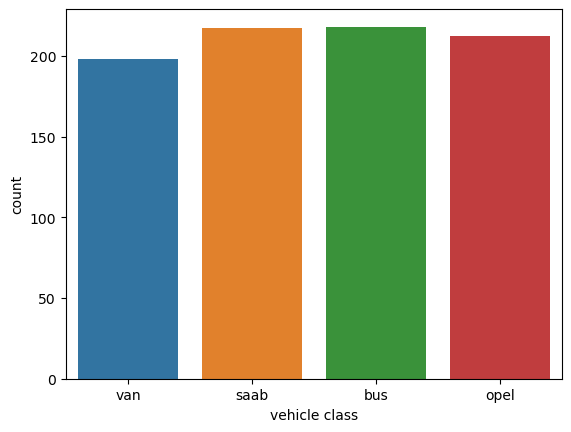

In [8]:
sns.countplot(x="vehicle class", data=dfy,)

<AxesSubplot:xlabel='compactness', ylabel='circularity'>

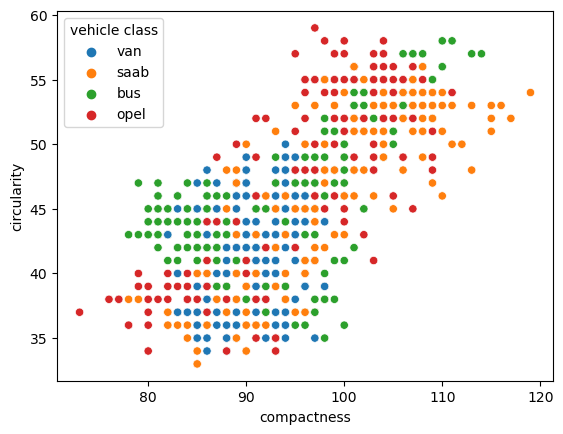

In [12]:
sns.scatterplot(x="compactness", y="circularity", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='distance circularity'>

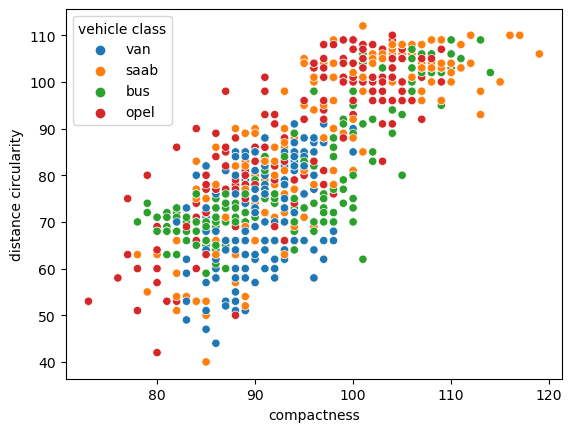

In [13]:
sns.scatterplot(x="compactness", y="distance circularity", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='radius ratio'>

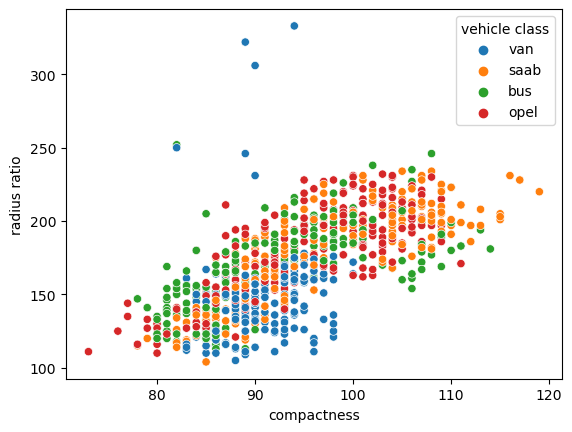

In [19]:
sns.scatterplot(x="compactness", y="radius ratio", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='pr.azis aspect ratio'>

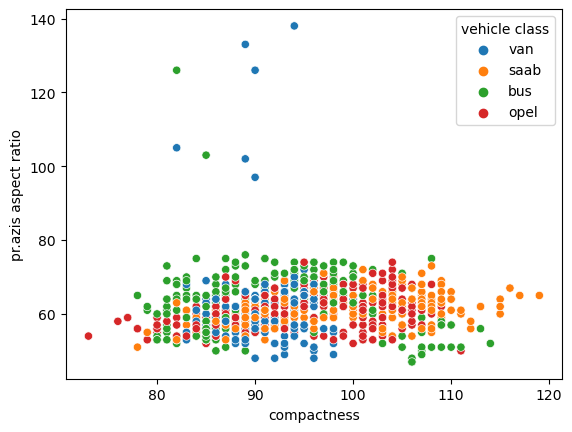

In [20]:
sns.scatterplot(x="compactness", y="pr.azis aspect ratio", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='max length aspect ratio'>

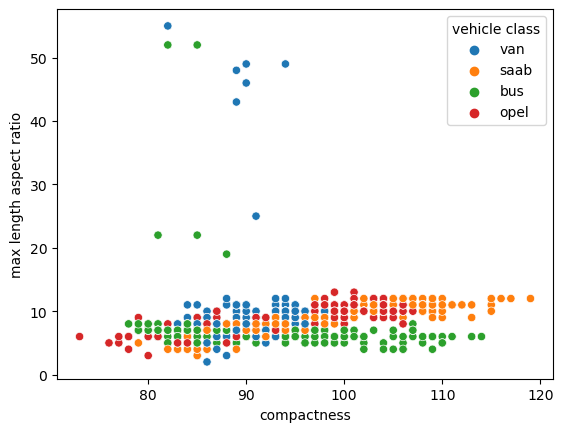

In [21]:
sns.scatterplot(x="compactness", y="max length aspect ratio", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='scatter ratio'>

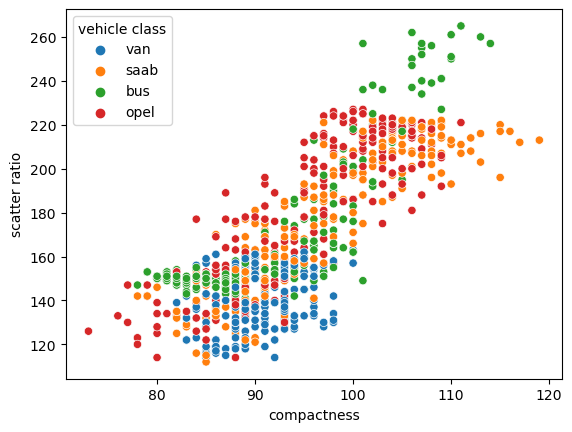

In [22]:
sns.scatterplot(x="compactness", y="scatter ratio", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='elongatedness'>

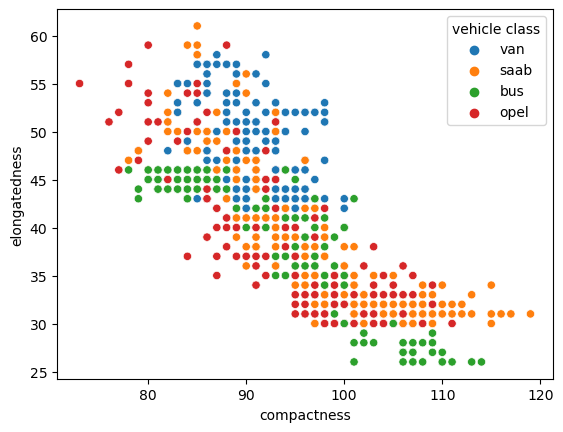

In [23]:
sns.scatterplot(x="compactness", y="elongatedness", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='pr axis rectangularity'>

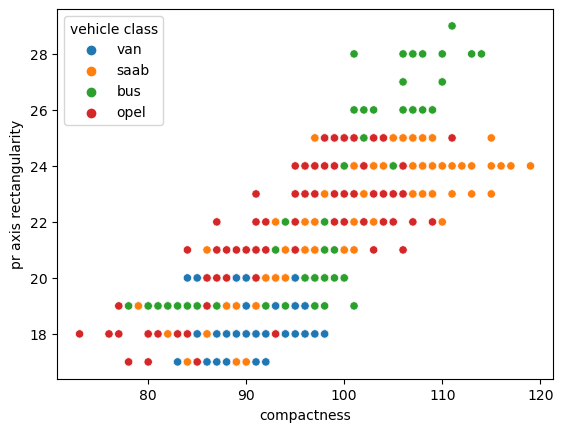

In [28]:
sns.scatterplot(x="compactness", y="pr axis rectangularity", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='max length rectangularity'>

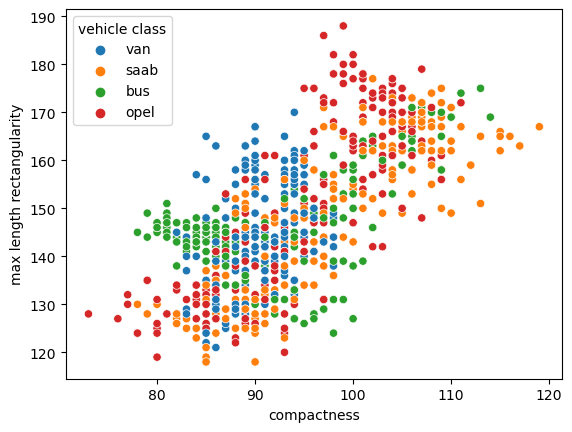

In [31]:
sns.scatterplot(x="compactness", y="max length rectangularity", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='scaled variance MAJOR AXIS'>

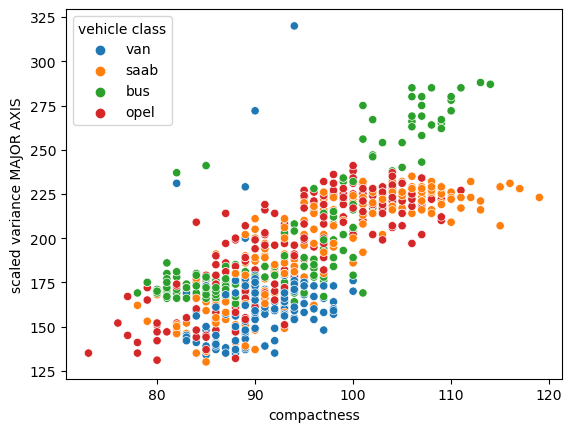

In [32]:
sns.scatterplot(x="compactness", y="scaled variance MAJOR AXIS", hue="vehicle class", data=dfall)

<AxesSubplot:xlabel='compactness', ylabel='scaled variance MINOR AXIS'>

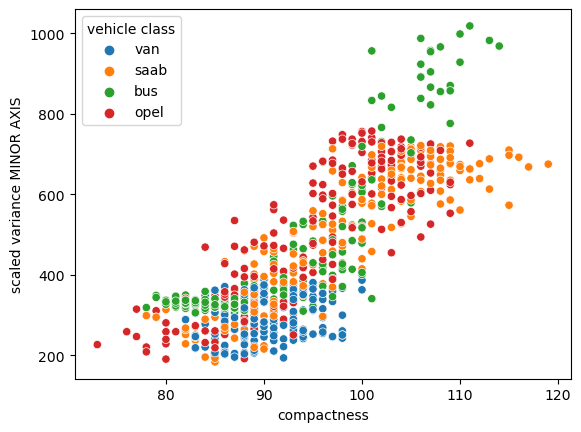

In [33]:
sns.scatterplot(x="compactness", y="scaled variance MINOR AXIS", hue="vehicle class", data=dfall)

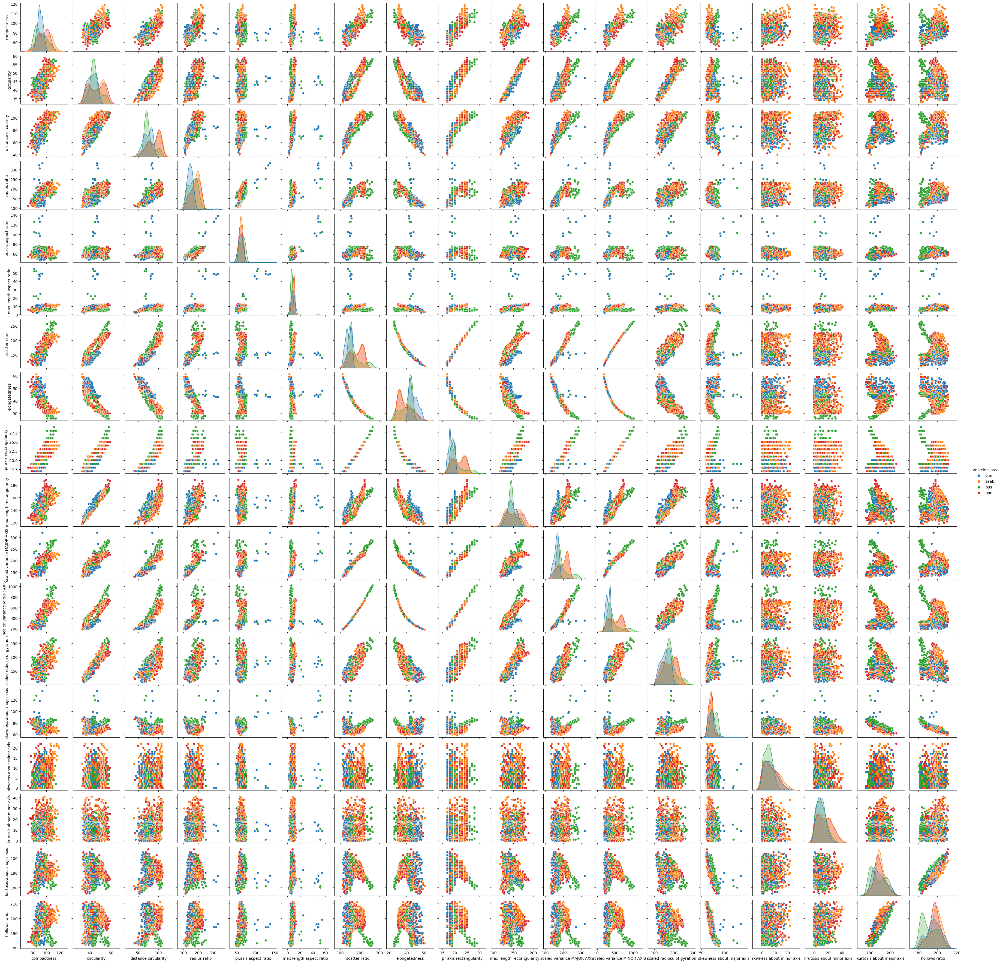

In [35]:
sns.pairplot(dfall, hue="vehicle class", height=2)

In [36]:
data.corr(method='pearson')

AttributeError: 'str' object has no attribute 'corr'

In [37]:
dfall.corr(method='pearson')

,compactness,circularity,distance circularity,radius ratio,pr.azis aspect ratio,max length aspect ratio,scatter ratio,elongatedness,pr axis rectangularity,max length rectangularity,scaled variance MAJOR AXIS,scaled variance MINOR AXIS,scaled radiosu of gyration,skewness about major axis,skwness about minor axis,krutosis about minor axis,kurtosis about major axis,hollows ratio
compactness,1.000000,0.692378,0.792180,0.691171,0.092263,0.147431,0.812743,-0.788496,0.813167,0.675627,0.764070,0.818366,0.584680,-0.253062,0.232645,0.157672,0.297422,0.364970
circularity,0.692378,1.000000,0.798224,0.621897,0.148493,0.246537,0.860018,-0.828311,0.857592,0.965697,0.807996,0.852366,0.935939,0.058864,0.146856,-0.014474,-0.114012,0.037447
distance circularity,0.792180,0.798224,1.000000,0.771321,0.160671,0.263628,0.907224,-0.912551,0.895221,0.774207,0.864322,0.889527,0.705383,-0.231717,0.115309,0.265474,0.147516,0.334858
radius ratio,0.691171,0.621897,0.771321,1.000000,0.665053,0.447446,0.737838,-0.792051,0.710847,0.569189,0.797092,0.725208,0.538061,-0.182500,0.048845,0.175517,0.380459,0.468729
pr.azis aspect ratio,0.092263,0.148493,0.160671,0.665053,1.000000,0.647824,0.104765,-0.183630,0.078715,0.127982,0.273653,0.091014,0.123242,0.152441,-0.057972,-0.033593,0.237850,0.266824
max length aspect ratio,0.147431,0.246537,0.263628,0.447446,0.647824,1.000000,0.165691,-0.178730,0.160831,0.305129,0.318573,0.143614,0.188826,0.294720,0.014229,0.043960,-0.027767,0.143323
scatter ratio,0.812743,0.860018,0.907224,0.737838,0.104765,0.165691,1.000000,-0.973418,0.992074,0.810196,0.951736,0.996329,0.800473,-0.028530,0.072588,0.212076,0.003230,0.118824
elongatedness,-0.788496,-0.828311,-0.912551,-0.792051,-0.183630,-0.178730,-0.973418,1.000000,-0.950525,-0.774962,-0.938254,-0.956626,-0.765583,0.104942,-0.050997,-0.187024,-0.111219,-0.215543
pr axis rectangularity,0.813167,0.857592,0.895221,0.710847,0.078715,0.160831,0.992074,-0.950525,1.000000,0.812883,0.938125,0.992335,0.797838,-0.016234,0.080704,0.214367,-0.022864,0.097423
max length rectangularity,0.675627,0.965697,0.774207,0.569189,0.127982,0.305129,0.810196,-0.774962,0.812883,1.000000,0.746524,0.797649,0.866186,0.040502,0.135938,0.002173,-0.108632,0.075644


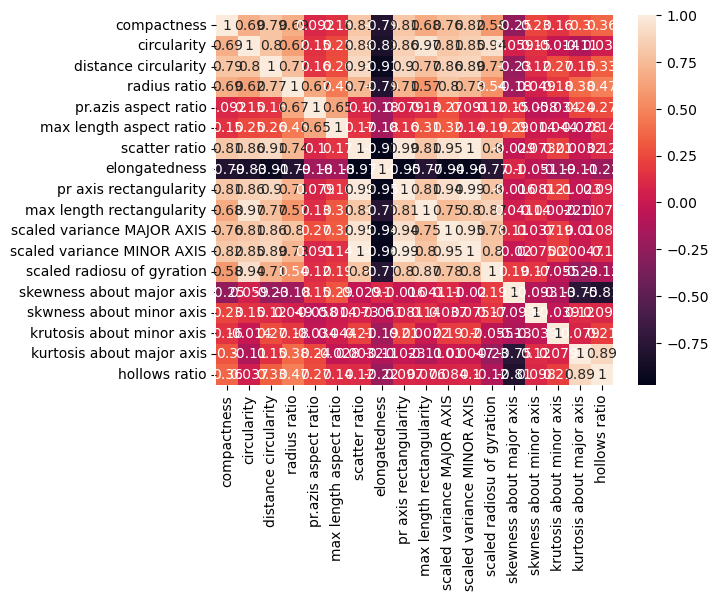

In [39]:
sns.heatmap(dfall.corr(method='pearson'),annot=True);
plt.show()